# Introduction to Remote Sensing: <br> NDVI Change Detection of Pipeline Construction

## Preamble

In [1]:
import ipyleaflet
import matplotlib.pyplot as plt
import pystac_client
import shapely
import stacmap

from IPython.display import Image
from odc.stac import load
from shapely import Polygon
from shapely.geometry import box
from tqdm import tqdm

from utils import *

## Introduction

For this remote sensing tutorial, we will investigate the trail of destruction produced by the Coastal GasLink pipeline as it was bulldozed through traditional Wet'suwet'en territory in Western "Canada". 

![](img/ww_territory_1024x606.jpg)

## Getting the data

Remote Sensing data is, without exception, ALWAYS accessed from commercial or governmental actors. There is no such thing as grassroots remote sensing data. However, through tools like PyStac, we can still access the data privately and without giving our information to these actors.

PyStac allows us to directly access some of these resources as they are stored by actors such as AWS, Google, and Microsoft. In this tutorial, we will use data as provided by the AWS affiliated company Element84. There are a few other providers that give access to the same data.

In [2]:
client = pystac_client.Client.open("https://earth-search.aws.element84.com/v1")

Once we've established the connection to Element84, we can check what data and from which satellites do we have access to.

In [3]:
collections = list(client.get_collections())
n_collections = len(collections)

In [4]:
print(f"There are {n_collections} collections:\n")
for c in collections:
    print(c.id)

There are 9 collections:

sentinel-2-pre-c1-l2a
cop-dem-glo-30
naip
cop-dem-glo-90
landsat-c2-l2
sentinel-2-l2a
sentinel-2-l1c
sentinel-2-c1-l2a
sentinel-1-grd


There are three different satellites 

1. Data from the Sentinel missions of the Copernicus program: sentinel-2-pre-c1-l2a, sentinel-2-l2a, sentinel-2-l1c, sentinel-2-c1-l2a, sentinel-1-grd
2. Data from the TanDEM-X mission of the Copernicus program: ```cop-dem-glo-30``` \& ```cop-dem-glo-90```
3. Data from the National Agriculture Imagery Program (NAIP): [naip](https://naip-usdaonline.hub.arcgis.com/)
4. Data from the LandSat program: [landsat-c2-l2](https://www.usgs.gov/landsat-missions/landsat-collection-2-level-2-science-products)

## Sentinel-2

We will use the [sentinel-2-l2a dataset](https://docs.sentinel-hub.com/api/latest/data/sentinel-2-l2a/). This dataset has a few advantegous properties. It is:

1. Available at a good resolution. 10 m, 20 m, and 60 m depending on wavelength
2. A MultiSpectral Instrument (MSI) with 13 bands: 4 visible bands, 6 Near-Infrared bands, and 3 Short-Wave Infrared bands
3. Available at a frequent interval: Collected every 5 days'
4. Available at ```"l2a"```, i.e. atmospherically corrected surfance reflectance

Moreover:
- It is available at land and coastal areas between latitudes 56°S and 83°N
- Global data available since January 2017, some local patches since October 2016

In [5]:
collection = "sentinel-2-l2a"

This data is available almost "real time". We can, for instance, easily get data for August in September of the year this was written (2024).

In [6]:
date = "2024-08-01/2024-08-31"

Before accessing the satellite data, we have to choose a specific area of interest (AOI). We can use the package ```ipyleaflet``` to visualize a point in the Wet'suwet'en territory.

In [7]:
m = ipyleaflet.Map()
m.center = 54.15, -127.5
m.zoom = 9
m.layout.height = "100px"
m.layout.width = "400px"
m

Map(center=[54.15, -127.5], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_…

This preview can *directly* be used to get the "bounding box" (bbox) of our AOI.

In [11]:
bbox=[m.west, m.south, m.east, m.north]

Now, using this bbox and our dates of interest, we can retrieve information *about* the images that are available for that AOI at that time.

We run our query with three filters we want images with

1. less than 5% of their pixels missing.
2. less than 5% degraded spectral data.
3. less than 5% cloud cover.

Additionally, we recommend the service return only 5 images.

In [12]:
%%time
items_t1 = client.search(collections=[collection], # Filter by collection
                         datetime=date, # Filter by date
                         bbox=bbox, # Filter by area
                         query=["s2:nodata_pixel_percentage<5",
                                "s2:degraded_msi_data_percentage<5",
                                "eo:cloud_cover<5"], # Filter by quality
                         limit=5) # Limit n returned images to 5

CPU times: user 1.31 ms, sys: 20 μs, total: 1.33 ms
Wall time: 1.35 ms


What we get in return is a PyStac ```ItemSearch```. This is like getting the search results of Google. You haven't yet loaded the data of the websites returned by your search, only some data *about* each website.

Similarly, we now have data *about* the relevant images, not yet the images.

Why? Because these images are HUGE! You could easily end up downloading 10s of gigabytes by accident.

In [13]:
items_t1

In [14]:
n_items_t1 = len(items_t1.item_collection())
n_items_t1

5

Before downloading the actual images, we can use the ```stacmap``` package the size and various properties of our images of interest.

Here, we look at the water percentage of each image. It's an arbitrary attribute, but it shows how the images correspond to the underlying map :) 

In [21]:
stacmap.explore(
    items_t1.item_collection(), 
    prop="s2:water_percentage", 
    bbox=bbox,
    height="500px",
    width="500px"
)

Using a custom function, we can print some attributes of each image.

In [229]:
print_item_collection_attributes(items_t1)

5 items found:

ID: S2B_9UWV_20240831_0_L2A 
 Cloud cover (%): 4.714158 
 Missing pixels (%): 0 
 Missing band data (%): 0.0052 
 Image area (km^2): 1.64 

ID: S2A_9UWA_20240806_0_L2A 
 Cloud cover (%): 3.497553 
 Missing pixels (%): 0 
 Missing band data (%): 0 
 Image area (km^2): 1.67 

ID: S2A_9UXV_20240803_0_L2A 
 Cloud cover (%): 0.627009 
 Missing pixels (%): 0 
 Missing band data (%): 0.0014 
 Image area (km^2): 1.64 

ID: S2A_9UXA_20240803_0_L2A 
 Cloud cover (%): 6e-05 
 Missing pixels (%): 0.370785 
 Missing band data (%): 0.0058 
 Image area (km^2): 1.67 

ID: S2B_9UXV_20240801_0_L2A 
 Cloud cover (%): 0.438869 
 Missing pixels (%): 4.997565 
 Missing band data (%): 0.021 
 Image area (km^2): 1.55 



## Working with one image

Before working with the whole set of images, let's take a look at just one image. We'll pick the one with the least cloud cover.

In [23]:
min_cloud_t1 = get_item_with_min_attribute(items_t1, attr='eo:cloud_cover')

In [24]:
min_cloud_t1

<Item id=S2A_9UXA_20240803_0_L2A>

Before loading the image, we can access a low resolution "thumbnail" preview of it.

In [25]:
Image(url=min_cloud_t1.assets["thumbnail"].href, width=400)

The image is very low res, but it gives us a sense of what's to come.

## Choosing our bands

There are MANY assets in the Sentinel-2 data we could choose among:

In [214]:
print_assets(min_cloud_t1)

aot | Aerosol optical thickness (AOT)
blue | Blue (band 2) - 10m
coastal | Coastal aerosol (band 1) - 60m
granule_metadata | None
green | Green (band 3) - 10m
nir | NIR 1 (band 8) - 10m
nir08 | NIR 2 (band 8A) - 20m
nir09 | NIR 3 (band 9) - 60m
red | Red (band 4) - 10m
rededge1 | Red edge 1 (band 5) - 20m
rededge2 | Red edge 2 (band 6) - 20m
rededge3 | Red edge 3 (band 7) - 20m
scl | Scene classification map (SCL)
swir16 | SWIR 1 (band 11) - 20m
swir22 | SWIR 2 (band 12) - 20m
thumbnail | Thumbnail image
tileinfo_metadata | None
visual | True color image
wvp | Water vapour (WVP)
aot-jp2 | Aerosol optical thickness (AOT)
blue-jp2 | Blue (band 2) - 10m
coastal-jp2 | Coastal aerosol (band 1) - 60m
green-jp2 | Green (band 3) - 10m
nir-jp2 | NIR 1 (band 8) - 10m
nir08-jp2 | NIR 2 (band 8A) - 20m
nir09-jp2 | NIR 3 (band 9) - 60m
red-jp2 | Red (band 4) - 10m
rededge1-jp2 | Red edge 1 (band 5) - 20m
rededge2-jp2 | Red edge 2 (band 6) - 20m
rededge3-jp2 | Red edge 3 (band 7) - 20m
scl-jp2 | Sce

We are interested in two different types of imagery:

- RGB (red, green, blue), i.e. "standard" photography
- The Normalized Difference Vegetation Index (NDVI), which required the red and near-infrared (NIR) bands

So, we pick the following bands:

In [210]:
selected_bands = ["nir","red","green","blue"]

All of these are available at the 10m resolution!

## Getting the appropriate polygon

We are still only dealing with descriptions of our data, *not* the actual data. 

Before we load the data, recall that the images of interestet were MUCH larger than our area of interest. So we want to filter and only load part of each image. 

To do this, we find the intersection polygons between (1) each image of interest and (2) the total area of interest.

For our example image, the bounds of the image can be found like this:

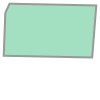

In [100]:
min_cloud_t1_poly = Polygon(*min_cloud_t1.geometry['coordinates'])
min_cloud_t1_poly

For the bbox of our total AOI, like this:

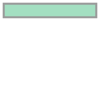

In [101]:
bbox_poly = box(*bbox)
bbox_poly

Now, we can use the Python package ```shapely``` to find their intersection.

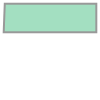

In [102]:
intersection_poly = shapely.intersection(
    bbox_poly,
    min_cloud_t1_poly)

intersection_poly

For our example image, *this* is the part of the image that we want to retrieve!

## Loading the image

To reiterate. 

To actually get the data and not just a description of it, we need to "load" it. 

- We only pick the relevant bands
- We limit the image to the intersection polygon
- We lower the resolution

In [103]:
data_t1 = load([min_cloud_t1], 
               bands = selected_bands,
               bbox=intersection_poly.bounds,
               resolution=10,
               progress=tqdm).isel(time=0)

100%|█████████████████████████████████████████████████████| 8/8 [00:13<00:00,  1.63s/it]


## Visualizing the image (RGB)

Normally, RGB data is expressed on the 0 to 255 or 0 to 1 range. That's no the case with Sentinel-2 data, so we normalize it into the 0, 255 range.

In [204]:
normalized_rgb_t1 = normalize_to_rgb(data_t1)

In [106]:
normalized_rgb_t1.shape

(1877, 3456, 3)

Now we can get a regular RGB image of the intersection polygon we are interested in.

Text(0.5, 1.0, "One image of Coastal Gaslink in Wet'suwet'en territory")

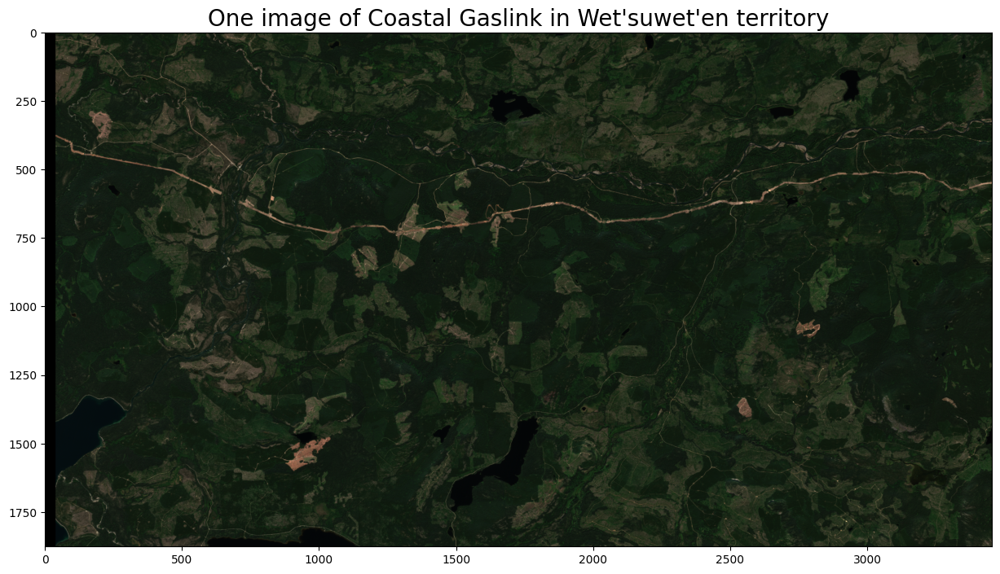

In [153]:
fig, ax = plt.subplots(figsize=(15, 15))

cax = ax.imshow(normalized_rgb_t1)
ax.set_title("One image of Coastal Gaslink in Wet'suwet'en territory", size=20)

### NDVI on one image

The formula for NDVI is:

$$
NDVI = \frac{(nir - red)}{(nir + red)}
$$


In code, this can be written as

In [ ]:
red = data_t1["red"].astype("float")
nir = data_t1["nir"].astype("float")
ndvi = (nir - red) / (nir + red)

Using ```matplotlib```, we can plot the NDVI values for T1 like so.

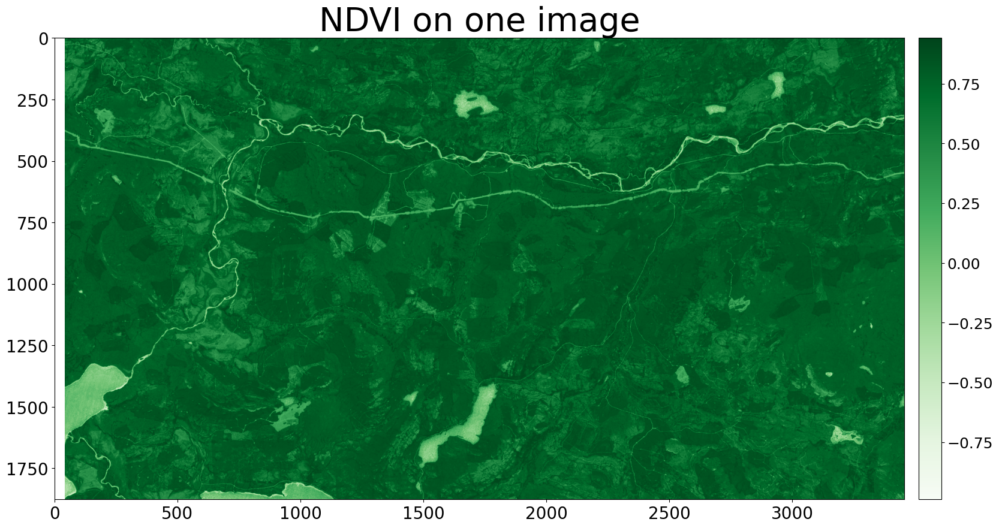

In [161]:
fig, ax = plt.subplots(figsize=(30, 10))
cax = ax.imshow(ndvi, cmap="Greens")
ax.set_title("NDVI on one image", size=40)
ax.tick_params(axis='both', which='major', labelsize=20)
cbar = fig.colorbar(cax, pad=0.01)
cbar.ax.tick_params(labelsize=18) 

## NDVI medians over a month

Instead of the NDVI for a specific day, we want a more stable measurement of NDVI over a season or month. Here we will calculate the NDVI for all the August 2024 images we collected as our "T1" data.

In [110]:
%%time

ndvis_t1 = calculate_ndvi_over_items(items_t1, selected_bands, bbox)

Processing item 1 out of 5


100%|███████████████████████████████████████████████████| 12/12 [00:06<00:00,  1.72it/s]


Processing item 2 out of 5


100%|███████████████████████████████████████████████████| 12/12 [00:29<00:00,  2.43s/it]


Processing item 3 out of 5


100%|█████████████████████████████████████████████████████| 8/8 [00:08<00:00,  1.10s/it]


Processing item 4 out of 5


100%|█████████████████████████████████████████████████████| 8/8 [00:19<00:00,  2.45s/it]


Processing item 5 out of 5


100%|█████████████████████████████████████████████████████| 8/8 [00:10<00:00,  1.34s/it]


CPU times: user 9.81 s, sys: 4.19 s, total: 14 s
Wall time: 1min 17s


Next, we calculate the median for this entire dataset.

In [112]:
%time mean_ndvis_t1 = calculate_mean_ndvi(ndvis_t1)

Concatenating NDVI images.
Calculating the means, this will take a while.
CPU times: user 6.09 s, sys: 2.34 s, total: 8.43 s
Wall time: 8.64 s


These calculations are *much* easier to track in xArray than Numpy, but mapping is easier with the latter. So we convert our data to Numpy, after all calculations are done.

In [113]:
mean_ndvis_t1_np = xr_ndvi_data_to_np(mean_ndvis_t1)

Now we can map it.

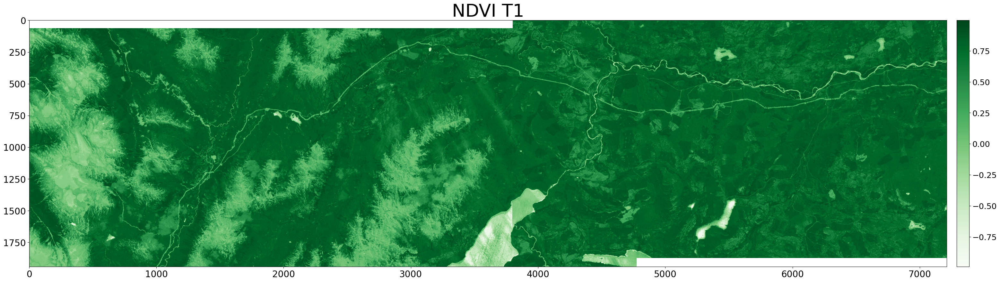

In [147]:
plot_territory(mean_ndvis_t1_np, 30, 10, 'Greens', 'NDVI T1')

We can see the long corridor of forest running from east to West that was cut away for the Coastal GasLink  pipeline.

## NDVI change detection

In this case, we *know* that Coastal GasLink is there and hence we are able to pick it out from the image. But what if that was not the case? In this case, to find the pipeline, we would want to find what kind of change *humans* have introduced to the area since construction of the pipeline started in 2020.

### Choosing your "T0"

To get a sense of how the area looked like before construction, we take a similar date range to our T1, but for 2019.

In [115]:
dates_t0 = "2019-08-01/2019-08-31"

We run a similar search for this time, but with ... . We also set the thresholds for missing pixel and MSI degraded data a bit higher. Why? Exploring the data, I found the quality was a bit lower so in order to get enough for the comparison we have to set a higher threshold.

In [116]:
%%time
items_t0 = client.search(
    collections=[collection], 
    datetime=dates_t0,
    bbox=bbox,
    query=["s2:nodata_pixel_percentage<10",
           "s2:degraded_msi_data_percentage<10",
           "eo:cloud_cover<5"],
    max_items = 7)

CPU times: user 1.77 ms, sys: 3.2 ms, total: 4.97 ms
Wall time: 4.49 ms


There are 11 items in the collection, but we limited the number to seven, so only seven will be printed.

In [202]:
print_item_collection_attributes(items_t0)

11 items found:

S2B_9UWV_20190828_0_L2A : 1.497236 9.3e-05 0 1.64
S2B_9UWV_20190828_1_L2A : 0.679148 0 0 1.64
S2B_9UXV_20190828_1_L2A : 1.489927 5.428502 0.0117 1.55
S2B_9UXV_20190828_0_L2A : 1.386388 5.269179 0 1.55
S2B_9UWA_20190828_0_L2A : 2.020514 1.7e-05 0 1.67
S2B_9UWA_20190828_1_L2A : 3.452464 0 0.0068 1.67
S2B_9UXA_20190828_0_L2A : 3.018898 3e-06 0 1.67


The available images have a similar coverage to those from 2024.

In [189]:
stacmap.explore(
    items_t0.item_collection(), 
    prop="s2:water_percentage", 
    bbox=bbox,
    width="400px",
    height="400px"
)

We again calculate all the NDVIs, now for T0. There are seven images in our dataset, so we have to calculate the NDVI seven times.

In [118]:
%%time

ndvis_t0 = calculate_ndvi_over_items(items_t0, selected_bands, bbox)

Processing item 1 out of 7


100%|███████████████████████████████████████████████████| 12/12 [00:07<00:00,  1.57it/s]


Processing item 2 out of 7


100%|███████████████████████████████████████████████████| 12/12 [00:06<00:00,  1.79it/s]


Processing item 3 out of 7


100%|█████████████████████████████████████████████████████| 8/8 [00:06<00:00,  1.33it/s]


Processing item 4 out of 7


100%|█████████████████████████████████████████████████████| 8/8 [00:06<00:00,  1.22it/s]


Processing item 5 out of 7


100%|███████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.30s/it]


Processing item 6 out of 7


100%|███████████████████████████████████████████████████| 12/12 [00:17<00:00,  1.45s/it]


Processing item 7 out of 7


100%|█████████████████████████████████████████████████████| 8/8 [00:13<00:00,  1.73s/it]


CPU times: user 16.4 s, sys: 5.49 s, total: 21.9 s
Wall time: 1min 16s


And, again, we calculate the medians.

In [124]:
%time mean_ndvi_t0 = calculate_mean_ndvi(ndvis_t0)

Concatenating NDVI images.
Calculating the means, this will take a while.
CPU times: user 6.86 s, sys: 2.26 s, total: 9.12 s
Wall time: 9.26 s


Convert them to numpy...

In [125]:
mean_ndvis_t0_np = xr_ndvi_data_to_np(mean_ndvi_t0)

And plot! 

Plotting the NDVI at this time, August 2019, we can see that the line of the Coastal GasLink pipeline is entirely missing.

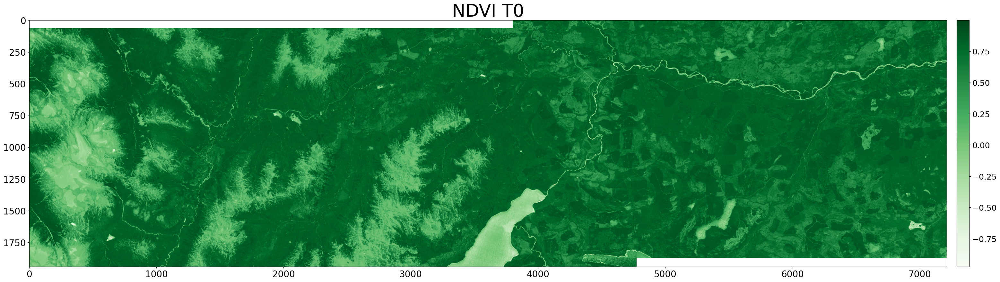

In [148]:
plot_territory(mean_ndvis_t0_np, 30, 10, 'Greens', 'NDVI T0')

## Calculating the NDVI difference

In [128]:
%%time

ndvi_difference = mean_ndvis_t1 - mean_ndvi_t0

CPU times: user 38.6 ms, sys: 32.5 ms, total: 71.2 ms
Wall time: 69.1 ms


In [129]:
ndvi_difference_np = xr_ndvi_data_to_np(ndvi_difference)

In [175]:
ndvi_difference_np[ndvi_difference_np>0] = 0

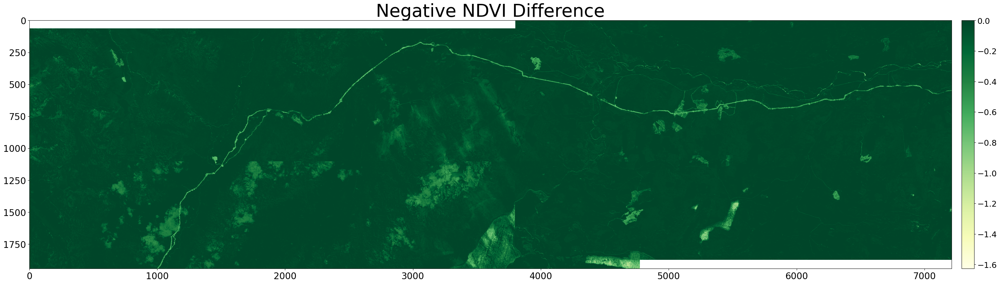

In [182]:
plot_territory(ndvi_difference_np, 40, 10, 'YlGn', 'Negative NDVI Difference')

What this image shows are *changes*. We seem to see mostly three types:

1. Smudge from clouds
2. Difference in water temperature

And then...

3. The wide path of forest that was cleared for the Coastal GasLink pipeline.

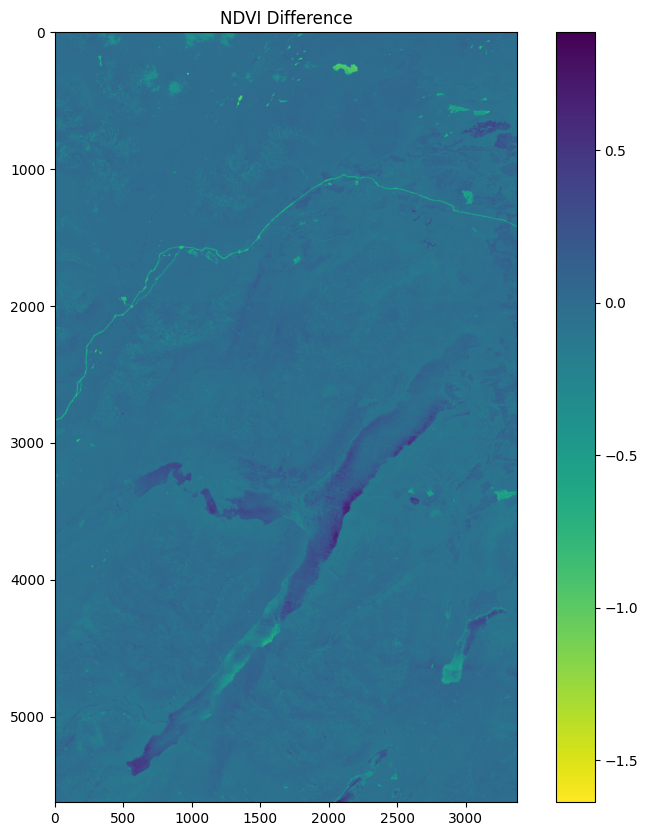

In [99]:
fig, ax = plt.subplots(figsize=(10, 10))
cax = ax.imshow(ndvi_difference, cmap='viridis_r')
ax.set_title("NDVI Difference")
fig.colorbar(cax)